<a href="https://colab.research.google.com/github/Niharika-Varshney/Dog-Breed-Prediction/blob/main/Dog_Breed_Prediction_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [137]:
print("GPU Available"if tf.config.list_physical_devices("GPU")else "GPU not available")

GPU Available


In [ ]:
labels_csv=pd.read_csv("Dog Vision/labels.csv")

In [ ]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

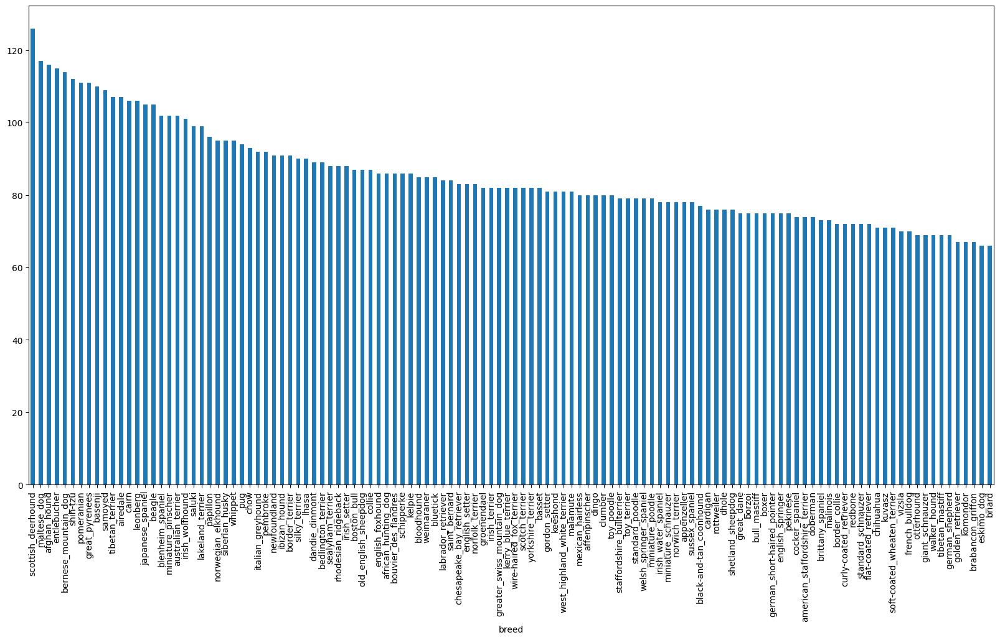

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

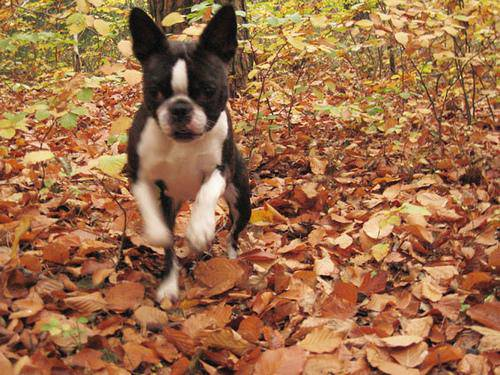

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
filenames=[i for i in labels_csv["id"]]
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [ ]:
list2=["/content/drive/MyDrive/Dog Vision/train/"+ i +".jpg"for i in labels_csv["id"]]
list2[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

if len(os.listdir("/content/drive/MyDrive/Dog Vision/train"))==len(filenames):
    print("yes")
else:
    print("No")

yes


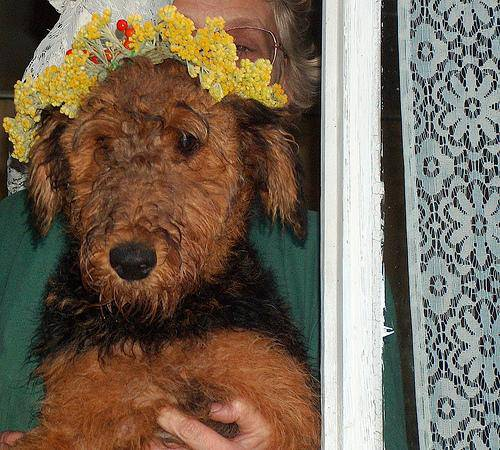

In [ ]:
#now i can just enter any index and it will print the image using list2
Image(list2[4456])

In [ ]:
labels_csv["breed"]

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
labels_csv["id"]

0        000bec180eb18c7604dcecc8fe0dba07
1        001513dfcb2ffafc82cccf4d8bbaba97
2        001cdf01b096e06d78e9e5112d419397
3        00214f311d5d2247d5dfe4fe24b2303d
4        0021f9ceb3235effd7fcde7f7538ed62
                       ...               
10217    ffd25009d635cfd16e793503ac5edef0
10218    ffd3f636f7f379c51ba3648a9ff8254f
10219    ffe2ca6c940cddfee68fa3cc6c63213f
10220    ffe5f6d8e2bff356e9482a80a6e29aac
10221    fff43b07992508bc822f33d8ffd902ae
Name: id, Length: 10222, dtype: object

as we can see in above two cells that the datatypes are object we need to convert them to int i.e. numeric

In [ ]:
labels1=np.array(labels_csv)
labels1

array([['000bec180eb18c7604dcecc8fe0dba07', 'boston_bull'],
       ['001513dfcb2ffafc82cccf4d8bbaba97', 'dingo'],
       ['001cdf01b096e06d78e9e5112d419397', 'pekinese'],
       ...,
       ['ffe2ca6c940cddfee68fa3cc6c63213f', 'airedale'],
       ['ffe5f6d8e2bff356e9482a80a6e29aac', 'miniature_pinscher'],
       ['fff43b07992508bc822f33d8ffd902ae', 'chesapeake_bay_retriever']],
      dtype=object)

In [ ]:
labels2=np.array(labels_csv["breed"])
#labels2=labels["breed"].to_numpy()    (does same thing as above)
labels2

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels2)

10222

In [ ]:
len(filenames)

10222

In [ ]:
uni=np.unique(labels2)
uni

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(uni)

120

In [ ]:

#for example humne compare kiya boston_bull se toh ab jha bhi boston_bull hoga wha true aaega else false
print(labels2[0])
labels2[0]==uni

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#now we are turning each label to a boolean array
boolean_labels= [i==uni for i in labels2]
len(boolean_labels)

10222

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(labels2)

10222

In [ ]:
len(boolean_labels)

10222

In [ ]:
#now we are turning boolean arrays we get above to integers

print(labels2[0])#to see which original value we have
print(np.where(uni==labels2[0]))#index where true occurs
print(boolean_labels[0].argmax())#index where true iccurs in boolean array
print(boolean_labels[0].astype(int))#to print an integer array...where 1 will be true for true else 0

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(boolean_labels[4].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:4]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d']

Kaggle doen not provide validation set so we are going to make validation set

In [ ]:
#for making validation set we will create x and y
X=list2
y=boolean_labels

In [ ]:
#set the number of images to use for experimenting
#we set the number of images bcoz the data is very very large
NUM_IMAGES=1000 #@param {type:"slider",mix:100,max:1000}

In [ ]:
#splitting the data into two parts i.e train set and validaton set
from sklearn.model_selection import train_test_split
#split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                            test_size=0.2,
                                            random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)


(800, 800, 200, 200)

In [ ]:
X_train[:3]

['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg']

In [ ]:
y_train[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
X_val[:3]

['/content/drive/MyDrive/Dog Vision/train/0ca9280205bd68d201e1d708db3f209d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/12405b2e93417d81f5308769c4e184c7.jpg',
 '/content/drive/MyDrive/Dog Vision/train/1242da788ce85d4311e1cc9922a0a809.jpg']

In [ ]:
y_val[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
from matplotlib.pyplot import imread
#imread read an image from a file into an array
image1=imread("/content/drive/MyDrive/Dog Vision/test/35fb3b47f33d4711c68bbd8667573b89.jpg")
image1.shape


(500, 375, 3)

array([[[216, 220, 221],
        [168, 172, 175],
        [122, 125, 130],
        ...,
        [ 52,  61,  76],
        [ 40,  45,  51],
        [ 53,  52,  50]],

       [[208, 212, 213],
        [172, 176, 179],
        [190, 193, 198],
        ...,
        [ 40,  48,  61],
        [ 40,  43,  48],
        [ 50,  49,  47]],

       [[131, 135, 136],
        [137, 141, 144],
        [211, 214, 219],
        ...,
        [ 33,  42,  51],
        [ 46,  50,  53],
        [ 51,  50,  48]],

       ...,

       [[102, 107, 136],
        [101, 107, 133],
        [ 99, 103, 128],
        ...,
        [ 98, 105, 115],
        [ 92,  99, 109],
        [ 91,  98, 108]],

       [[ 97, 102, 131],
        [ 89,  95, 121],
        [ 82,  86, 111],
        ...,
        [ 94, 101, 111],
        [ 89,  96, 106],
        [ 88,  95, 105]],

       [[ 90,  95, 124],
        [ 82,  88, 114],
        [ 77,  81, 106],
        ...,
        [ 87,  94, 104],
        [ 82,  89,  99],
        [ 82,  89,  99]]], dtype=uint8)
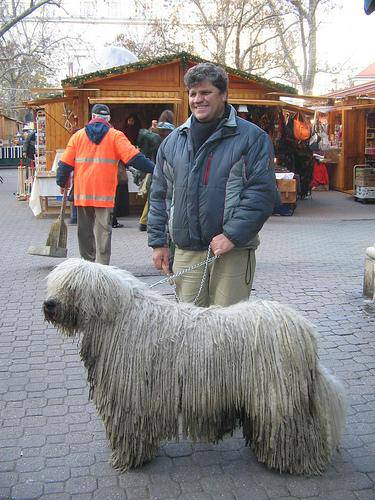

In [ ]:
image1

In [ ]:
#this tells the range of rcb pixels of the image
image1.max(),image1.min()

(255, 0)

In [ ]:
# from matplotlib.pyplot import imread
# #imread read an image from a file into an array
# image=imread(list2[42])
# image.shape


In [ ]:
#the output of this tells us how an image looks like a tensor
tf.constant(image1)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[216, 220, 221],
        [168, 172, 175],
        [122, 125, 130],
        ...,
        [ 52,  61,  76],
        [ 40,  45,  51],
        [ 53,  52,  50]],

       [[208, 212, 213],
        [172, 176, 179],
        [190, 193, 198],
        ...,
        [ 40,  48,  61],
        [ 40,  43,  48],
        [ 50,  49,  47]],

       [[131, 135, 136],
        [137, 141, 144],
        [211, 214, 219],
        ...,
        [ 33,  42,  51],
        [ 46,  50,  53],
        [ 51,  50,  48]],

       ...,

       [[102, 107, 136],
        [101, 107, 133],
        [ 99, 103, 128],
        ...,
        [ 98, 105, 115],
        [ 92,  99, 109],
        [ 91,  98, 108]],

       [[ 97, 102, 131],
        [ 89,  95, 121],
        [ 82,  86, 111],
        ...,
        [ 94, 101, 111],
        [ 89,  96, 106],
        [ 88,  95, 105]],

       [[ 90,  95, 124],
        [ 82,  88, 114],
        [ 77,  81, 106],
        ...,
        [ 87,  94, 10

In [ ]:
#define image size
IMG_SIZE=224

#create a function to process images
def process_image(image_path):
    #read in an image file
    image=tf.io.read_file(image_path)
    #turn the jpeg imgage into numerical tensors with 3 colour channels{rgb}
    image=tf.image.decode_jpeg(image,channels=3)#channels=3 because of rgb
    #convert the colour channel values from 0 to255 to 0-1 values  ....this process is called normalization
    image=tf.image.convert_image_dtype(image,tf.float32)
    #resize the image
    image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
    return image



In [ ]:
t=tf.io.read_file(list2[34])
#this will produce a bunch of characters i.e. tensors

In [ ]:

t=tf.image.decode_jpeg(t,channels=3)
t

<tf.Tensor: shape=(407, 594, 3), dtype=uint8, numpy=
array([[[ 22,  25,  30],
        [ 21,  24,  29],
        [ 32,  35,  40],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 39,  42,  47],
        [ 23,  26,  31],
        [ 36,  39,  44],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 28,  32,  35],
        [ 19,  23,  26],
        [ 31,  35,  38],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       ...,

       [[ 42,  46,  49],
        [ 50,  54,  57],
        [ 52,  56,  59],
        ...,
        [  2,   9,  19],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 32,  36,  39],
        [ 40,  44,  47],
        [ 46,  50,  53],
        ...,
        [  4,  11,  21],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 21,  25,  28],
        [ 25,  29,  32],
        [ 32,  36,  39],
        ...,
        [  7,  14,  2

In [ ]:
tf.image.convert_image_dtype(t,tf.float32)

<tf.Tensor: shape=(407, 594, 3), dtype=float32, numpy=
array([[[0.08627451, 0.09803922, 0.11764707],
        [0.08235294, 0.09411766, 0.1137255 ],
        [0.1254902 , 0.13725491, 0.15686275],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.15294118, 0.16470589, 0.18431373],
        [0.09019608, 0.10196079, 0.12156864],
        [0.14117648, 0.15294118, 0.17254902],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.10980393, 0.1254902 , 0.13725491],
        [0.07450981, 0.09019608, 0.10196079],
        [0.12156864, 0.13725491, 0.14901961],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       ...,

       [[0.16470589, 0.18039216, 0.19215688],
        [0.19

In [ ]:
print(process_image(list2[34]))


tf.Tensor(
[[[0.09042301 0.10218772 0.12179556]
  [0.11473363 0.12649834 0.14610618]
  [0.09272581 0.10449051 0.12409835]
  ...
  [0.8196079  0.79215693 0.7294118 ]
  [0.8136382  0.78618723 0.7234421 ]
  [0.80392164 0.77647066 0.7137255 ]]

 [[0.08168886 0.09737513 0.10913984]
  [0.09317888 0.10886515 0.12062985]
  [0.1127224  0.12840867 0.14017338]
  ...
  [0.8196079  0.79215693 0.7294118 ]
  [0.8136382  0.78618723 0.7234421 ]
  [0.80480576 0.7773548  0.7146096 ]]

 [[0.1778584  0.19354467 0.20530938]
  [0.10785257 0.12353884 0.13530354]
  [0.17694902 0.1926353  0.2044    ]
  ...
  [0.8196079  0.79215693 0.7294118 ]
  [0.8136382  0.78618723 0.7234421 ]
  [0.8078432  0.7803922  0.7176471 ]]

 ...

 [[0.14830667 0.16399294 0.17575765]
  [0.15846673 0.174153   0.1859177 ]
  [0.16065186 0.17633814 0.18810284]
  ...
  [0.03429985 0.05782926 0.10488809]
  [0.0156779  0.04125546 0.08421799]
  [0.02745098 0.04313726 0.07843138]]

 [[0.18254425 0.19823052 0.20999523]
  [0.17136858 0.18705487 0

In [ ]:
def get_image_label(image_path,label):
    image=process_image(image_path)
    return image,label

In [ ]:
print(get_image_label(list2[34],5))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.09042301, 0.10218772, 0.12179556],
        [0.11473363, 0.12649834, 0.14610618],
        [0.09272581, 0.10449051, 0.12409835],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.08168886, 0.09737513, 0.10913984],
        [0.09317888, 0.10886515, 0.12062985],
        [0.1127224 , 0.12840867, 0.14017338],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80480576, 0.7773548 , 0.7146096 ]],

       [[0.1778584 , 0.19354467, 0.20530938],
        [0.10785257, 0.12353884, 0.13530354],
        [0.17694902, 0.1926353 , 0.2044    ],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.8078432 , 0.7803922 , 0.7176471 ]],

       ...,

       [[0.14830667, 0.16399294, 0.17575765],
        [0.1

In [ ]:
process_image(list2[34])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.09042301, 0.10218772, 0.12179556],
        [0.11473363, 0.12649834, 0.14610618],
        [0.09272581, 0.10449051, 0.12409835],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.08168886, 0.09737513, 0.10913984],
        [0.09317888, 0.10886515, 0.12062985],
        [0.1127224 , 0.12840867, 0.14017338],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80480576, 0.7773548 , 0.7146096 ]],

       [[0.1778584 , 0.19354467, 0.20530938],
        [0.10785257, 0.12353884, 0.13530354],
        [0.17694902, 0.1926353 , 0.2044    ],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.8078432 , 0.7803922 , 0.7176471 ]],

       ...,

       [[0.14830667, 0.16399294, 0.17575765],
        [0.15

In [ ]:
tf.constant(list2[34])
#this is not producing any output bcoz list2[34] is a image path


<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/Dog Vision/train/00f34ac0a16ef43e6fd1de49a26081ce.jpg'>

In [ ]:
list2[34]

'/content/drive/MyDrive/Dog Vision/train/00f34ac0a16ef43e6fd1de49a26081ce.jpg'

In [ ]:
(process_image(X[34]),y[34])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.09042301, 0.10218772, 0.12179556],
         [0.11473363, 0.12649834, 0.14610618],
         [0.09272581, 0.10449051, 0.12409835],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80392164, 0.77647066, 0.7137255 ]],
 
        [[0.08168886, 0.09737513, 0.10913984],
         [0.09317888, 0.10886515, 0.12062985],
         [0.1127224 , 0.12840867, 0.14017338],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80480576, 0.7773548 , 0.7146096 ]],
 
        [[0.1778584 , 0.19354467, 0.20530938],
         [0.10785257, 0.12353884, 0.13530354],
         [0.17694902, 0.1926353 , 0.2044    ],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.8078432 , 0.7803922 , 0.7176471 ]],
 
        ...,
 
        [[0.14830667, 0.16399294

In [ ]:
(process_image(X[34]),tf.constant(y[34]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.09042301, 0.10218772, 0.12179556],
         [0.11473363, 0.12649834, 0.14610618],
         [0.09272581, 0.10449051, 0.12409835],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80392164, 0.77647066, 0.7137255 ]],
 
        [[0.08168886, 0.09737513, 0.10913984],
         [0.09317888, 0.10886515, 0.12062985],
         [0.1127224 , 0.12840867, 0.14017338],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80480576, 0.7773548 , 0.7146096 ]],
 
        [[0.1778584 , 0.19354467, 0.20530938],
         [0.10785257, 0.12353884, 0.13530354],
         [0.17694902, 0.1926353 , 0.2044    ],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.8078432 , 0.7803922 , 0.7176471 ]],
 
        ...,
 
        [[0.14830667, 0.16399294

In [ ]:
BATCH_SIZE=32
#create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
    """
    creates batches of data out of image (X) and label (y) pairs
    accepts test data as input(now y can be none bcoz test data has no labels)
    shuffles the data if it's a training data
    but does not shuffle if it's a validation data

    """

    #if the data is a test dataset
    #do not have labels
    #do not shuffle
    if test_data:
        print("creating test data batches....")
        data=tf.data.Dataset.from_tensor_slices(tf.constant(X))#only filepaths no labels
        #X here is file paths ....so when using tf.constant(X) it turns X into tensors
        data_batch=data.map(process_image).batch(BATCH_SIZE)
        return data_batch
    #if the data is a valid dataset
    #validation set has labels
    #we wont shuffle
    elif valid_data:
        print("creating valid data batches....")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y)))
        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    #if the data is training dataset
    #we will shuffle dataset
    #has labels
    else:
        print("creating training data batches....")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y)))
        #shuffling pathnames and labels before mapping into processor function is fater than shuffling images
        data=data.shuffle(buffer_size=len(X))

        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch









In [ ]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

creating training data batches....
creating valid data batches....


In [ ]:
#will produce specifications/attributes of our data batches
#first line for X second line for y
#we have none for batch size in output bcoz batch size is flexible
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
data

<_TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(120,), dtype=tf.bool, name=None))>

In [ ]:
data=data.shuffle(buffer_size=len(X))
data

<_ShuffleDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(120,), dtype=tf.bool, name=None))>

visualising data batches

In [ ]:
import matplotlib.pyplot as plt
#create a function to view images in a data batch
def show_25_images(images,labels):
    """
    displays a plot of 25 images from a data batch
    """
    plt.figure(figsize=(10,10))
    for i in range(25):
        ax=plt.subplot(5,5,i+1)
        #imshow() display data as an image
        plt.imshow(images[i])
        #add the image label as the title
        plt.title(uni[labels[i].argmax()])
        plt.axis("off")






In [ ]:
uni[y[23].argmax()],y[23].argmax()

('bedlington_terrier', 10)

In [ ]:
train_data
#this is a batch
#now to visualize our data we need to unbatch the data which is done by the
#method in the next block

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels


(array([[[[0.79158795, 0.69470274, 0.5725571 ],
          [0.66108286, 0.5630437 , 0.44147506],
          [0.6814689 , 0.5838201 , 0.4665775 ],
          ...,
          [0.3421079 , 0.38790452, 0.37518403],
          [0.34166878, 0.4046615 , 0.41781595],
          [0.35425434, 0.4248426 , 0.44052887]],
 
         [[0.77824485, 0.6906573 , 0.5684038 ],
          [0.7434966 , 0.6510771 , 0.5295085 ],
          [0.72953945, 0.63729864, 0.5167524 ],
          ...,
          [0.26686263, 0.3405777 , 0.35359243],
          [0.3018096 , 0.3743547 , 0.39608726],
          [0.31948543, 0.3872638 , 0.4113797 ]],
 
         [[0.6715214 , 0.5985347 , 0.48241076],
          [0.66353965, 0.58519226, 0.465096  ],
          [0.69085175, 0.6020564 , 0.48017266],
          ...,
          [0.2493784 , 0.35844725, 0.3870451 ],
          [0.28244936, 0.35909492, 0.38795346],
          [0.306609  , 0.37327567, 0.40437332]],
 
         ...,
 
         [[0.6199191 , 0.53019226, 0.36940795],
          [0.75821

In [ ]:
len(train_images),len(train_labels)
#bcoz batch size is 32


(32, 32)

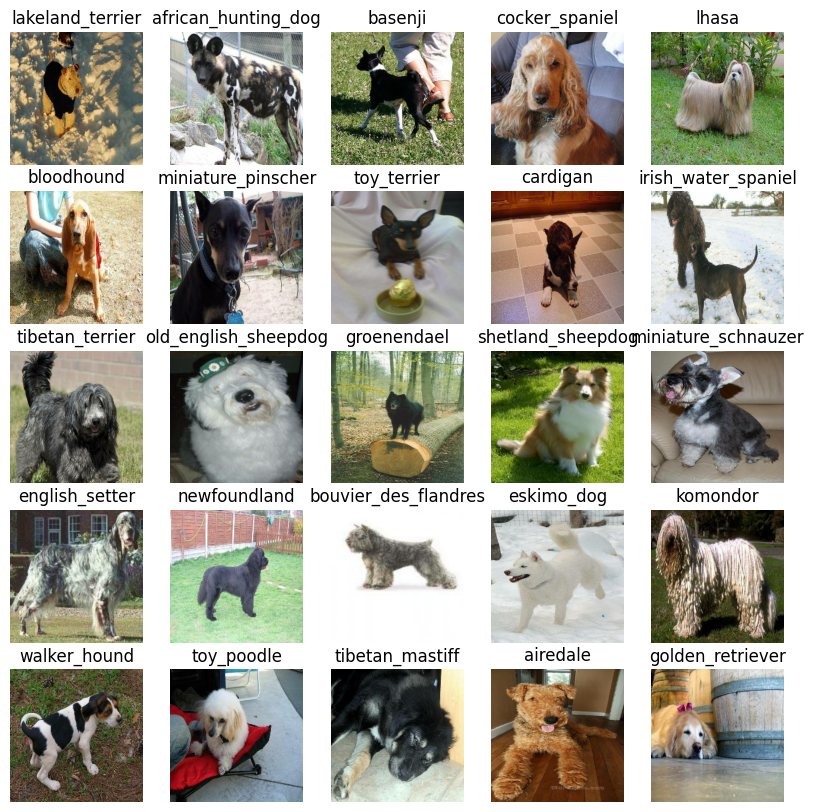

In [ ]:
show_25_images(train_images,train_labels)
#this shows our data of train batch

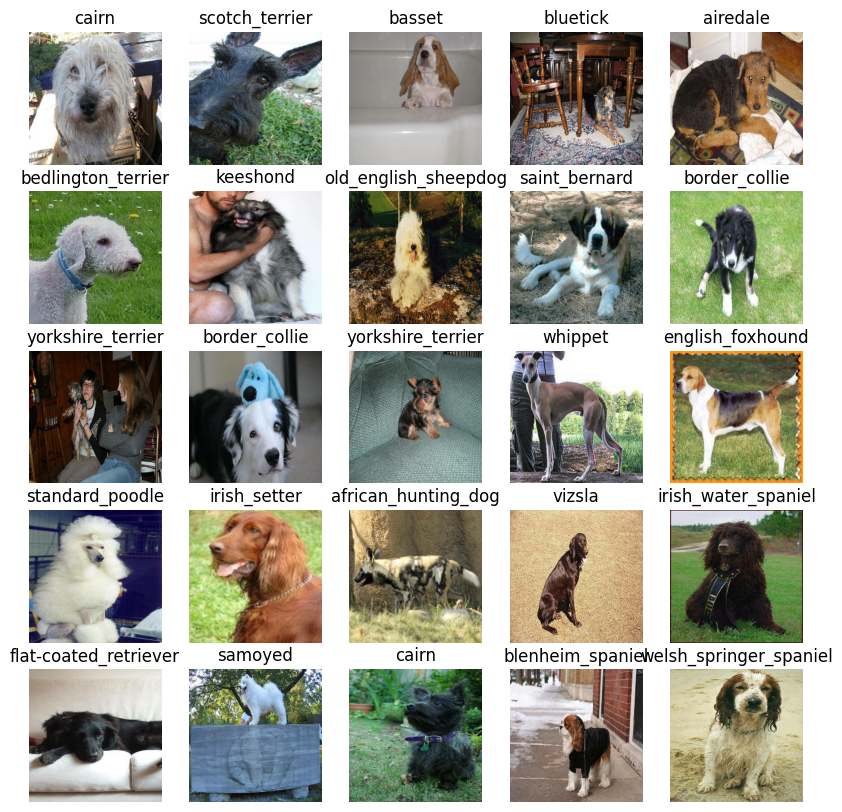

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)
#this shows our data of validation batch


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(uni) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:

model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
%load_ext tensorboard
import datetime
def create_tensorboard_callback():
    logdir=os.path.join("/content/drive/MyDrive/Dog Vision/log",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [ ]:
NUM_EPOCHS=30 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
def train_model():
    model=create_model()
    tensorboard=create_tensorboard_callback()
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard,early_stopping])
    return model



In [ ]:
model=train_model()

#800 images in taining set and batch size is 32 800/32=25

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/30
25/25 [==============================] - 208s 8s/step - loss: 4.6183 - accuracy: 0.0887 - val_loss: 3.5167 - val_accuracy: 0.2500
Epoch 2/30
25/25 [==============================] - 6s 242ms/step - loss: 1.6646 - accuracy: 0.6875 - val_loss: 2.2083 - val_accuracy: 0.4950
Epoch 3/30
25/25 [==============================] - 4s 148ms/step - loss: 0.5844 - accuracy: 0.9350 - val_loss: 1.7100 - val_accuracy: 0.5700
Epoch 4/30
25/25 [==============================] - 6s 262ms/step - loss: 0.2537 - accuracy: 0.9887 - val_loss: 1.5204 - val_accuracy: 0.6450
Epoch 5/30
25/25 [==============================] - 4s 168ms/step - loss: 0.1492 - accuracy: 0.9975 - val_loss: 1.4446 - val_accuracy: 0.6450
Epoch 6/30
25/25 [==============================] - 6s 235ms/step - loss: 0.1024 - accuracy: 0.9987 - val_loss: 1.3933 - val_accuracy: 0.6500
Epoch 7/30
25/25 [==============================] - 4s 1

In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/Dog Vision/log'


<IPython.core.display.Javascript object>

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 107ms/step


array([[2.30277044e-04, 2.85365211e-04, 8.94196855e-04, ...,
        3.15865356e-04, 3.91754802e-05, 1.57948409e-03],
       [2.62832711e-03, 8.48369964e-04, 6.60706498e-03, ...,
        1.18595075e-04, 3.04695615e-03, 3.59187514e-04],
       [4.02183869e-05, 2.84859707e-05, 7.64523884e-06, ...,
        3.10485266e-05, 1.74814286e-05, 5.76244609e-04],
       ...,
       [2.61264950e-06, 4.79288683e-05, 4.08694905e-05, ...,
        4.58703516e-06, 3.43303982e-05, 1.26281102e-05],
       [1.53368618e-03, 1.32222340e-04, 6.09128620e-05, ...,
        1.95448214e-04, 5.36912630e-05, 9.22253914e-03],
       [9.55800235e-04, 2.22858421e-06, 3.42949352e-04, ...,
        4.51027136e-03, 3.14195640e-04, 2.08816837e-05]], dtype=float32)

In [ ]:
predictions.shape
#200 refers to y_val 120 refers to length of unique breeds

(200, 120)

In [ ]:
len(predictions[0]),len(predictions[1])

(120, 120)

In [ ]:
predictions[0]
#gives probability value for every single layer
#each value of the output  is called confidence interval

array([2.3027704e-04, 2.8536521e-04, 8.9419686e-04, 1.6752149e-04,
       2.0266458e-04, 4.4905701e-05, 9.4280448e-03, 2.0787267e-04,
       5.8049533e-05, 1.9986907e-04, 4.4347244e-04, 3.5010919e-04,
       3.3461189e-04, 1.5910268e-04, 1.3562106e-04, 2.1813891e-03,
       1.8793697e-05, 4.0566796e-01, 2.0018764e-05, 5.5780194e-05,
       8.9034799e-04, 7.1583001e-04, 1.3228288e-05, 4.8891234e-04,
       4.7672984e-05, 7.3189432e-05, 2.0131934e-01, 4.6709327e-05,
       4.4858400e-04, 1.5278388e-04, 5.2678126e-05, 9.0869330e-04,
       4.7090201e-04, 6.1475948e-05, 9.9298872e-05, 7.5153718e-03,
       1.7926453e-05, 3.6985709e-04, 7.6037206e-05, 1.5486519e-04,
       5.3763465e-04, 8.1495882e-06, 2.6392570e-04, 4.4452045e-05,
       2.2174903e-05, 5.6648609e-05, 1.1650634e-05, 3.5149959e-04,
       1.0951613e-04, 1.3411569e-04, 2.0834384e-04, 8.1943959e-05,
       3.7614469e-04, 1.1851821e-04, 6.0154456e-05, 1.5500290e-04,
       4.5645912e-04, 3.5355022e-04, 7.7049155e-04, 4.0861718e

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
predictions[0].max(),predictions[0].min()

(0.40566796, 7.711078e-06)

In [ ]:
index=43
predictions[index]
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {uni[np.argmax(predictions[index])]}") # the predicted label

Max value (probability of prediction): 0.7424351572990417
Sum: 1.0
Max index: 16
Predicted label: border_collie


In [ ]:
#print(f"Predicted label: {uni[np.argmax(predictions[index])]}") # the predicted label
#jo kaam yahan upar kiya tha whi kr rhe
def get_pred_label(prediction_probabilities):
    return uni[np.argmax(prediction_probabilities)]

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:

def unbatchify(data):
    images_=[]
    labels_=[]
    for image,label in data.unbatch().as_numpy_iterator():
        images_.append(image)
#     print(image)
#     print(label)

        labels_.append(label)
    return images_,labels_


In [ ]:
images_,labels_=unbatchify(val_data)
images_[43]
labels_[43]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
get_pred_label(labels_[43])

'collie'

In [ ]:
get_pred_label(predictions[43])

'border_collie'

In [ ]:
##VISUAL1
def plot_pred(prediction_probabilities,labels,images,n):
    pred_prob,truth_label,image=prediction_probabilities[n],labels[n],images[n]
    pred_label=get_pred_label(pred_prob)
    true_label=get_pred_label(truth_label)
    plt.imshow(image)

    plt.xticks([])
    plt.yticks([])

    if pred_label==true_label:
        color="green"
    else:
        color="red"
    plt.title("{}{:2.0f}%{}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                   color=color)







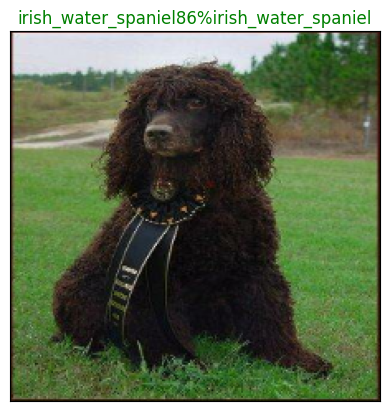

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=19) #for 1 batch only value above 32 will throw an error

In [ ]:
##VISUAL2
def plot_pred_conf(prediction_probabilities,labels,n):
    pred_prob,true_label=prediction_probabilities[n],labels[n]
    pred_label=get_pred_label(pred_prob)

    top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
    top_10_pred_values=pred_prob[top_10_pred_indexes]
    top_10_pred_labels=uni[top_10_pred_indexes]
    top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")
    if np.isin(true_label, top_10_pred_labels).any():
      top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
      pass









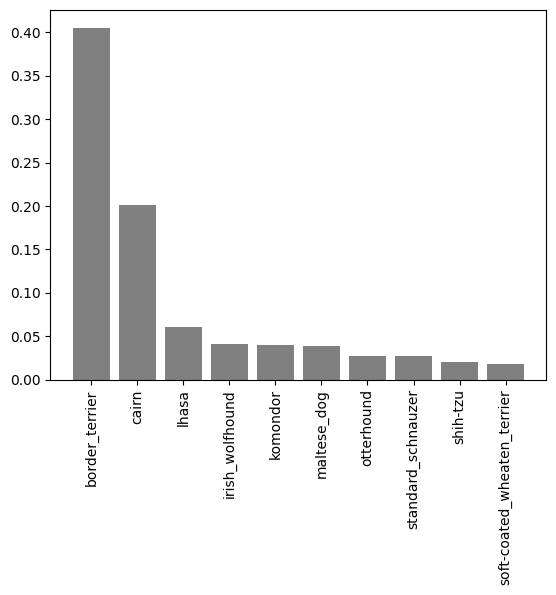

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=0)

In [ ]:
predictions[0].argsort()[-10:]


array([103, 100, 106,  83,  73,  65,  59,  70,  26,  17])

In [ ]:
predictions[0].argmax(),predictions[0].argmin()

(17, 92)

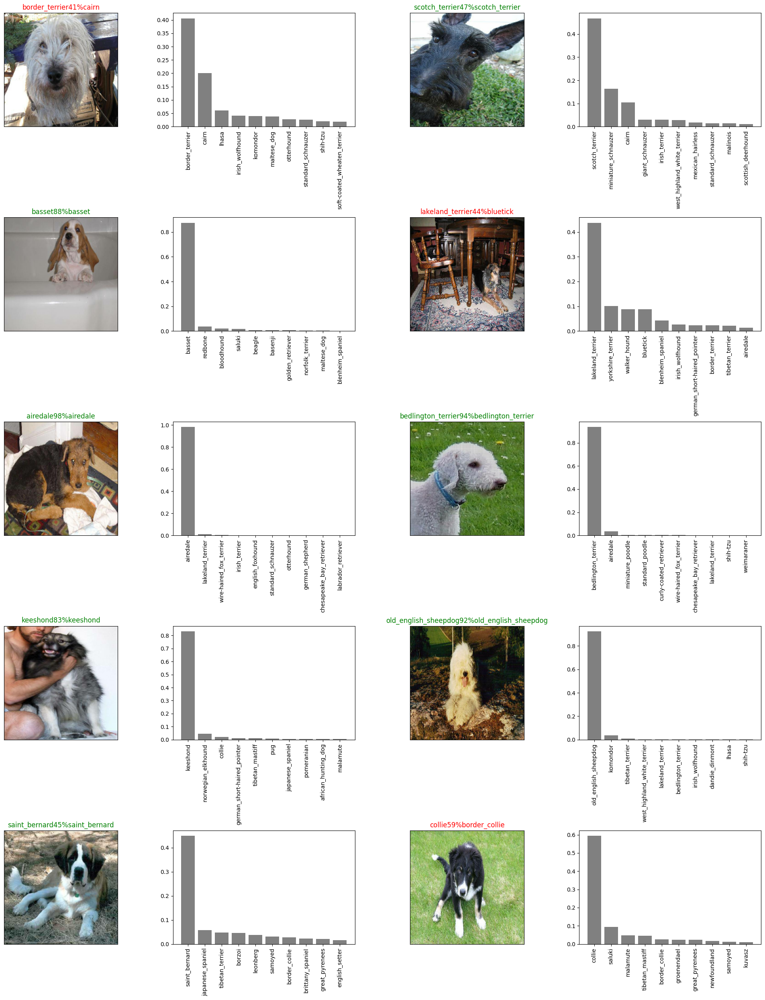

In [ ]:
##VISUAL3
i_multiplier=0
num_rows=5
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows,2*num_cols,2*i+1)
    plot_pred(prediction_probabilities=predictions,
             labels=val_labels,
             images=val_images,
             n=i+i_multiplier)

    plt.subplot(num_rows,2*num_cols,2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                  labels=val_labels,
                  n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)

plt.show()


In [ ]:
def save_model(model,suffix=None):
    #create new_folder
    modeldir=os.path.join("/content/drive/MyDrive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path=modeldir+"-"+suffix+".h5"
    print(f"saving model to {model_path}....")
    model.save(model_path)
    return model_path



In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix="1000-images-Adam")

saving model to /content/drive/MyDrive/Dog Vision/models/20240621-10091718964585-1000-images-Adam.h5....


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Vision/models/20240621-10091718964585-1000-images-Adam.h5'

In [ ]:
load_1000_images_model=load_model('/content/drive/MyDrive/Dog Vision/models/20240530-02101717035018-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240530-02101717035018-1000-images-Adam.h5


training the model on full data


In [ ]:
#training data
len(X),len(y)

(10222, 10222)

In [ ]:
X[:5]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
#create a data  batch with the full dataset
full_data=create_data_batches(X,y)


creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:

full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
#no validation set when training on all the data so we cant monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [108]:
full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping]
              )

Epoch 1/30
320/320 [==============================] - 1949s 6s/step - loss: 1.3559 - accuracy: 0.6671
Epoch 2/30
320/320 [==============================] - 44s 138ms/step - loss: 0.4034 - accuracy: 0.8820
Epoch 3/30
320/320 [==============================] - 45s 142ms/step - loss: 0.2371 - accuracy: 0.9356
Epoch 4/30
320/320 [==============================] - 46s 143ms/step - loss: 0.1554 - accuracy: 0.9639
Epoch 5/30
320/320 [==============================] - 46s 144ms/step - loss: 0.1079 - accuracy: 0.9770
Epoch 6/30
320/320 [==============================] - 45s 141ms/step - loss: 0.0787 - accuracy: 0.9852
Epoch 7/30
320/320 [==============================] - 47s 146ms/step - loss: 0.0583 - accuracy: 0.9923
Epoch 8/30
320/320 [==============================] - 45s 141ms/step - loss: 0.0454 - accuracy: 0.9944
Epoch 9/30
320/320 [==============================] - 45s 140ms/step - loss: 0.0381 - accuracy: 0.9958
Epoch 10/30
320/320 [==============================] - 45s 141ms/step - lo

In [109]:
test_path="/content/drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e78b50f1d12148deef4c564ea4c88050.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7ed96b272013c6de9505a753816ce75.jpg']

In [110]:
len(test_filenames)

10357

In [111]:
test_data=create_data_batches(test_filenames,test_data=True)

creating test data batches....


In [112]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [113]:
save_model(full_model,suffix="full-image-set")

saving model to /content/drive/MyDrive/Dog Vision/models/20240621-11051718967901-full-image-set.h5....


'/content/drive/MyDrive/Dog Vision/models/20240621-11051718967901-full-image-set.h5'

In [ ]:
loaded_full_model=load_model("/content/drive/MyDrive/Dog Vision/models/20240530-02431717036980-full-image-set.h5")


In [ ]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

In [ ]:
#save predictions to numpy array to csv file
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions1=np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [118]:
test_predictions[:2]

array([[2.07415585e-10, 1.23372298e-10, 4.00273459e-09, 1.74233072e-08,
        4.94899177e-05, 6.73055278e-10, 5.72009440e-10, 2.13512485e-10,
        9.26539201e-08, 1.13592662e-07, 6.03979800e-08, 3.28895383e-11,
        9.62590129e-05, 1.42086054e-09, 5.88416762e-04, 1.71484260e-06,
        2.02536343e-09, 1.50177666e-08, 1.07443568e-10, 1.08611955e-08,
        1.08830935e-08, 3.30132153e-08, 2.72596026e-07, 2.17446505e-09,
        2.82577139e-06, 4.14429053e-07, 1.91939797e-09, 4.34805447e-12,
        1.79702826e-02, 6.69005487e-07, 2.47136929e-11, 4.33652667e-06,
        6.48043352e-09, 4.03488514e-08, 2.13045205e-05, 2.98877501e-09,
        4.82709908e-08, 1.50707294e-07, 1.33498897e-05, 1.37797528e-04,
        1.14215266e-06, 2.18917702e-08, 5.10769155e-07, 1.04566507e-08,
        5.40118890e-06, 3.74675153e-07, 1.03259019e-08, 1.73411376e-04,
        7.25402245e-08, 9.14205387e-08, 4.23510693e-09, 1.97304435e-05,
        8.77355149e-08, 2.24922610e-06, 2.90567639e-11, 6.914128

In [ ]:
test_predictions1[:2]

In [ ]:
#above two cells are same

In [ ]:
test_predictions.shape

In [122]:
#preparring test data set for kaggle

In [123]:
preds_df=pd.DataFrame(columns=["id"]+list(uni))

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [124]:
#append test image ids to predicted dataframe
test_ids=[os.path.splitext(path)[0]for path in os.listdir(test_path)]


In [125]:
test_ids[0]

'e7b4b0e7d7d76f8dbd64920f34443b25'

In [126]:
preds_df["id"]=test_ids

In [127]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b4b0e7d7d76f8dbd64920f34443b25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e76a7a1d23d687b5015b07df762c0c10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7afcce6e45858fc3b294cc5c0b15a53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e78b4a09e5f86c330e24c6aaed63f0be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
preds_df[list(uni)]=test_predictions1
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b4b0e7d7d76f8dbd64920f34443b25,2.074156e-10,1.233723e-10,4.002735e-09,1.742331e-08,4.948992e-05,6.730553e-10,5.720094e-10,2.135125e-10,9.265392e-08,...,6.975293e-10,1.896193e-09,8.947514e-01,7.759253e-04,3.038952e-02,1.973542e-10,3.499366e-10,1.613499e-08,4.947015e-07,3.060459e-08
1,e76a7a1d23d687b5015b07df762c0c10,7.358321e-14,8.638090e-16,9.602934e-11,9.592883e-15,7.910069e-12,7.490007e-11,4.999034e-10,2.564548e-07,1.588143e-11,...,1.964970e-11,1.540852e-08,2.795355e-14,4.138100e-12,4.921458e-13,1.495856e-12,3.906158e-13,1.583993e-10,4.175981e-10,2.049488e-13
2,e7afcce6e45858fc3b294cc5c0b15a53,1.958863e-01,1.809846e-08,2.012320e-09,9.333374e-11,2.213113e-09,9.645156e-12,2.938876e-06,1.859943e-11,4.378911e-12,...,2.412691e-07,3.548382e-09,2.013077e-08,1.662119e-09,7.114925e-10,6.494497e-13,1.896179e-11,4.417108e-10,4.833301e-09,1.576684e-07
3,e78b4a09e5f86c330e24c6aaed63f0be,3.162186e-06,7.733273e-09,2.562730e-07,7.142279e-09,3.446470e-04,3.889609e-05,3.141170e-10,3.433380e-05,1.720420e-08,...,7.856092e-08,4.701813e-10,1.564003e-08,5.375501e-06,1.509925e-08,1.660193e-08,1.147950e-06,2.356829e-05,7.477706e-10,2.084362e-09
4,e7e9dd51302fe08c1c89a550e183cf07,3.892912e-04,1.162599e-07,1.082082e-08,8.108775e-07,9.106357e-07,1.557664e-08,1.740196e-01,3.254087e-08,1.000701e-08,...,8.392522e-07,5.117327e-03,1.230175e-08,3.666265e-10,1.856289e-08,7.854267e-09,1.239071e-05,2.107815e-07,1.466432e-05,8.166710e-01


In [129]:
#save our predictions dataframe to csv
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_dog_1.csv",index=False)

predicting on custom images

In [139]:
custom_path="/content/drive/MyDrive/Dog Vision/dog photos/"   #Put path of directory where photos of dogs are present which you want to try on your model
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]


In [131]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/dog photos/images1.jpg',
 '/content/drive/MyDrive/Dog Vision/dog photos/images2.jpg',
 '/content/drive/MyDrive/Dog Vision/dog photos/images3.jpg',
 '/content/drive/MyDrive/Dog Vision/dog photos/images4.jpg',
 '/content/drive/MyDrive/Dog Vision/dog photos/images5.jpg']

In [132]:
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [133]:
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [135]:
custom_preds.shape

(5, 120)

In [136]:
custom_pred_labels=[get_pred_label(custom_preds[i])for i in range(len(custom_preds))]
custom_pred_labels

['english_foxhound', 'dhole', 'afghan_hound', 'malinois', 'redbone']